In [1]:
from __future__ import print_function, division
import os
import numpy as np
from PIL import Image
import glob
import SimpleITK as sitk
from torch import optim
import torch.utils.data
import torch
import torch.nn.functional as F

import torch.nn
import torchvision
import matplotlib.pyplot as plt
import natsort
from torch.utils.data.sampler import SubsetRandomSampler
from Data_Loader import Images_Dataset, Images_Dataset_folder
import torchsummary
from torch.utils.tensorboard import SummaryWriter
from tensorboardX import SummaryWriter

import shutil
import random
from Models import Unet_dict, NestedUNet, U_Net, R2U_Net, AttU_Net, R2AttU_Net
from losses import calc_loss, dice_loss, threshold_predictions_v,threshold_predictions_p
from ploting import plot_kernels, LayerActivations, input_images, plot_grad_flow
from Metrics import dice_coeff, accuracy_score
import time
from ploting import VisdomLinePlotter
from visdom import Visdom


C:\Users\lucyh\anaconda3\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: '[WinError 127] The specified procedure could not be found'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [2]:
#######################################################
#Checking if GPU is used
#######################################################

train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available. Training on CPU')
else:
    print('CUDA is available. Training on GPU')

device = torch.device("cuda:0" if train_on_gpu else "cpu")

CUDA is not available. Training on CPU


In [3]:
#######################################################
#Setting the basic paramters of the model
#######################################################

batch_size = 32
print('batch_size = ' + str(batch_size))

valid_size = 0.15

epoch = 100
print('epoch = ' + str(epoch))

random_seed = random.randint(1, 20)
print('random_seed = ' + str(random_seed))

shuffle = True
valid_loss_min = np.Inf
num_workers = 4
lossT = []
lossL = []
lossL.append(np.inf)
lossT.append(np.inf)
epoch_valid = epoch-2
n_iter = 1
i_valid = 0

pin_memory = False
if train_on_gpu:
    pin_memory = True

#plotter = VisdomLinePlotter(env_name='Tutorial Plots')

batch_size = 32
epoch = 100
random_seed = 15


In [4]:
#######################################################
#Setting up the model
#######################################################

model_Inputs = [U_Net, R2U_Net, AttU_Net, R2AttU_Net, NestedUNet]


def model_unet(model_input, in_channel=3, out_channel=1):
    model_test = model_input(in_channel, out_channel)
    return model_test

#passsing this string so that if it's AttU_Net or R2ATTU_Net it doesn't throw an error at torchSummary


model_test = model_unet(model_Inputs[3], 3, 1)  # change model here

model_test.to(device)

R2AttU_Net(
  (Maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Maxpool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Maxpool4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (RRCNN1): RRCNN_block(
    (RCNN): Sequential(
      (0): Recurrent_block(
        (conv): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
      )
      (1): Recurrent_block(
        (conv): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
      )
    )
    (Conv

In [5]:
#######################################################
#Getting the Summary of Model
#######################################################

# torchsummary.summary(model_test, input_size=(3, 128, 128))

In [6]:
#######################################################
#Passing the Dataset of Images and Labels
#######################################################

t_data = 'C:/Users/lucyh/Desktop/Images/Cells/Images/'
l_data = 'C:/Users/lucyh/Desktop/Images/Cells/Binary/'
test_image = 'C:/Users/lucyh/Desktop/Images/Cells/Images/Mock 2 T0-0002-5k_#path610.tiff'
test_label = 'C:/Users/lucyh/Desktop/Images/Cells/Binary/Mock 2 T0-0002-5k_#path610.tiff'
test_folderP = 'C:/Users/lucyh/Desktop/Images/Cells/test/*'
test_folderL = 'C:/Users/lucyh/Desktop/Images/Cells/test_GT/*'

Training_Data = Images_Dataset_folder(t_data,
                                      l_data)


In [7]:
#######################################################
#Giving a transformation for input data
#######################################################

data_transform = torchvision.transforms.Compose([
            torchvision.transforms.Resize((128,128)),
         #   torchvision.transforms.CenterCrop(96),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])


In [8]:
#######################################################
#Trainging Validation Split
#######################################################

num_train = len(Training_Data)
indices = list(range(num_train))
split = int(np.floor(valid_size * num_train))

if shuffle:
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_idx, valid_idx = indices[split:], indices[:split]
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

train_loader = torch.utils.data.DataLoader(Training_Data, batch_size=batch_size, sampler=train_sampler,
                                           num_workers=num_workers, pin_memory=pin_memory,)

valid_loader = torch.utils.data.DataLoader(Training_Data, batch_size=batch_size, sampler=valid_sampler,
                                           num_workers=num_workers, pin_memory=pin_memory,)

In [9]:
#######################################################
#Using Adam as Optimizer
#######################################################

initial_lr = 0.001
opt = torch.optim.Adam(model_test.parameters(), lr=initial_lr) # try SGD
#opt = optim.SGD(model_test.parameters(), lr = initial_lr, momentum=0.99)

MAX_STEP = int(1e10)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(opt, MAX_STEP, eta_min=1e-5)
#scheduler = optim.lr_scheduler.CosineAnnealingLr(opt, epoch, 1)

In [10]:
#######################################################
#Creating a Folder for every data of the program
#######################################################

New_folder = './model'

if os.path.exists(New_folder) and os.path.isdir(New_folder):
    shutil.rmtree(New_folder)

try:
    os.mkdir(New_folder)
except OSError:
    print("Creation of the main directory '%s' failed " % New_folder)
else:
    print("Successfully created the main directory '%s' " % New_folder)


Successfully created the main directory './model' 


In [11]:
#######################################################
#Setting the folder of saving the predictions
#######################################################

read_pred = './model/pred'

In [12]:
#######################################################
#Checking if prediction folder exixts
#######################################################

if os.path.exists(read_pred) and os.path.isdir(read_pred):
    shutil.rmtree(read_pred)

try:
    os.mkdir(read_pred)
except OSError:
    print("Creation of the prediction directory '%s' failed of dice loss" % read_pred)
else:
    print("Successfully created the prediction directory '%s' of dice loss" % read_pred)


Successfully created the prediction directory './model/pred' of dice loss


In [13]:
#######################################################
#checking if the model exists and if true then delete
#######################################################

read_model_path = './model/Unet_D_' + str(epoch) + '_' + str(batch_size)

if os.path.exists(read_model_path) and os.path.isdir(read_model_path):
    shutil.rmtree(read_model_path)
    print('Model folder there, so deleted for newer one')

try:
    os.mkdir(read_model_path)
except OSError:
    print("Creation of the model directory '%s' failed" % read_model_path)
else:
    print("Successfully created the model directory '%s' " % read_model_path)


Successfully created the model directory './model/Unet_D_100_32' 


C:\Users\lucyh\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:131: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "
C:\Users\lucyh\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https:/

Epoch: 1/100 	Training Loss: 0.494627 	Validation Loss: 0.599221
Validation loss decreased (inf --> 0.599221).  Saving model 
3m 23s
Epoch: 2/100 	Training Loss: 0.379874 	Validation Loss: 0.617833
3m 31s
Epoch: 3/100 	Training Loss: 0.319594 	Validation Loss: 0.536190
Validation loss decreased (0.599221 --> 0.536190).  Saving model 
3m 36s
Epoch: 4/100 	Training Loss: 0.309645 	Validation Loss: 0.452699
Validation loss decreased (0.536190 --> 0.452699).  Saving model 
3m 23s
Epoch: 5/100 	Training Loss: 0.255166 	Validation Loss: 0.427139
Validation loss decreased (0.452699 --> 0.427139).  Saving model 
3m 29s
Epoch: 6/100 	Training Loss: 0.245445 	Validation Loss: 0.506593
3m 39s
Epoch: 7/100 	Training Loss: 0.251316 	Validation Loss: 0.451641
3m 24s
Epoch: 8/100 	Training Loss: 0.237544 	Validation Loss: 0.480542
3m 31s
Epoch: 9/100 	Training Loss: 0.224438 	Validation Loss: 0.577823
3m 29s
Epoch: 10/100 	Training Loss: 0.199929 	Validation Loss: 0.435332
3m 47s


C:\Users\lucyh\Downloads\Unet-Segmentation-Pytorch-Nest-of-Unets-master\ploting.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


Epoch: 11/100 	Training Loss: 0.204650 	Validation Loss: 0.471786
3m 43s
Epoch: 12/100 	Training Loss: 0.188805 	Validation Loss: 0.519513
3m 39s
Epoch: 13/100 	Training Loss: 0.188098 	Validation Loss: 0.449577
3m 33s
Epoch: 14/100 	Training Loss: 0.197217 	Validation Loss: 0.641243
3m 33s
Epoch: 15/100 	Training Loss: 0.191679 	Validation Loss: 0.632692
3m 27s
Epoch: 16/100 	Training Loss: 0.175748 	Validation Loss: 0.788000
3m 34s
Epoch: 17/100 	Training Loss: 0.174632 	Validation Loss: 0.667453
3m 28s
Epoch: 18/100 	Training Loss: 0.190741 	Validation Loss: 0.773906
3m 26s
Epoch: 19/100 	Training Loss: 0.193629 	Validation Loss: 0.593073
3m 34s
Epoch: 20/100 	Training Loss: 0.217502 	Validation Loss: 0.441748
3m 29s
Epoch: 21/100 	Training Loss: 0.188914 	Validation Loss: 0.706758
3m 24s
Epoch: 22/100 	Training Loss: 0.174169 	Validation Loss: 0.738230
3m 27s
Epoch: 23/100 	Training Loss: 0.160865 	Validation Loss: 0.594830
3m 34s
Epoch: 24/100 	Training Loss: 0.155549 	Validation 

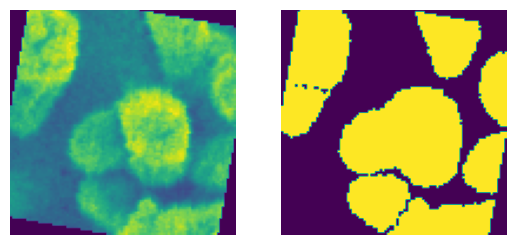

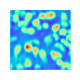

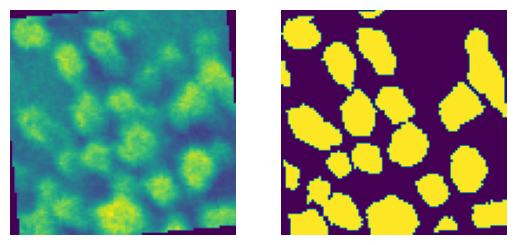

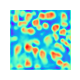

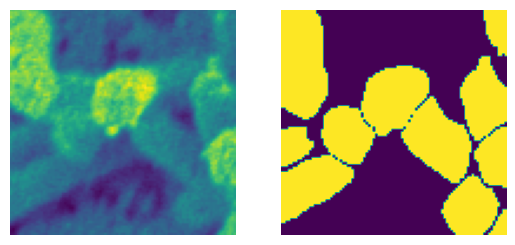

...

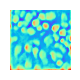

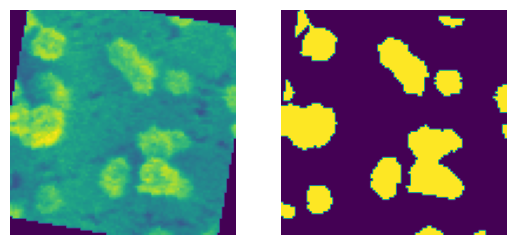

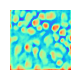

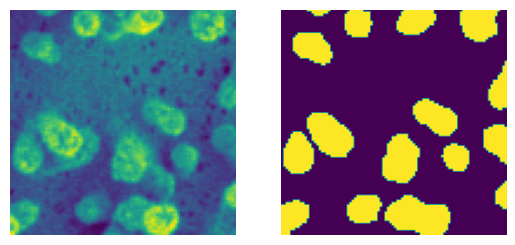

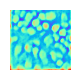

In [14]:
#######################################################
#Training loop
#######################################################

for i in range(epoch):

    train_loss = 0.0
    valid_loss = 0.0
    since = time.time()
    scheduler.step(i)
    lr = scheduler.get_lr()

    #######################################################
    #Training Data
    #######################################################

    model_test.train()
    k = 1

    for x, y in train_loader:
        x, y = x.to(device), y.to(device)

        #If want to get the input images with their Augmentation - To check the data flowing in net
        input_images(x, y, i, n_iter, k)

       # grid_img = torchvision.utils.make_grid(x)
        #writer1.add_image('images', grid_img, 0)

       # grid_lab = torchvision.utils.make_grid(y)

        opt.zero_grad()

        y_pred = model_test(x)
        lossT = calc_loss(y_pred, y)     # Dice_loss Used

        train_loss += lossT.item() * x.size(0)
        lossT.backward()
      #  plot_grad_flow(model_test.named_parameters(), n_iter)
        opt.step()
        x_size = lossT.item() * x.size(0)
        k = 2

    #    for name, param in model_test.named_parameters():
    #        name = name.replace('.', '/')
    #        writer1.add_histogram(name, param.data.cpu().numpy(), i + 1)
    #        writer1.add_histogram(name + '/grad', param.grad.data.cpu().numpy(), i + 1)


    #######################################################
    #Validation Step
    #######################################################

    model_test.eval()
    torch.no_grad() #to increase the validation process uses less memory

    for x1, y1 in valid_loader:
        x1, y1 = x1.to(device), y1.to(device)

        y_pred1 = model_test(x1)
        lossL = calc_loss(y_pred1, y1)     # Dice_loss Used

        valid_loss += lossL.item() * x1.size(0)
        x_size1 = lossL.item() * x1.size(0)

    #######################################################
    #Saving the predictions
    #######################################################

    im_tb = Image.open(test_image).convert('RGB')
    im_label = Image.open(test_label).convert('RGB')
    s_tb = data_transform(im_tb)
    s_label = data_transform(im_label)
    s_label = s_label.detach().numpy()

    pred_tb = model_test(s_tb.unsqueeze(0).to(device)).cpu()
    pred_tb = F.sigmoid(pred_tb)
    pred_tb = pred_tb.detach().numpy()

   #pred_tb = threshold_predictions_v(pred_tb)

    x1 = plt.imsave(
        './model/pred/img_iteration_' + str(n_iter) + '_epoch_'
        + str(i) + '.png', pred_tb[0][0])

  #  accuracy = accuracy_score(pred_tb[0][0], s_label)

    #######################################################
    #To write in Tensorboard
    #######################################################

    train_loss = train_loss / len(train_idx)
    valid_loss = valid_loss / len(valid_idx)

    if (i+1) % 1 == 0:
        print('Epoch: {}/{} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(i + 1, epoch, train_loss,
                                                                                      valid_loss))
 #       writer1.add_scalar('Train Loss', train_loss, n_iter)
  #      writer1.add_scalar('Validation Loss', valid_loss, n_iter)
        #writer1.add_image('Pred', pred_tb[0]) #try to get output of shape 3


    #######################################################
    #Early Stopping
    #######################################################

    if valid_loss <= valid_loss_min and epoch_valid >= i: # and i_valid <= 2:

        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model '.format(valid_loss_min, valid_loss))
        torch.save(model_test.state_dict(),'./model/Unet_D_' +
                                              str(epoch) + '_' + str(batch_size) + '/Unet_epoch_' + str(epoch)
                                              + '_batchsize_' + str(batch_size) + '.pth')
       # print(accuracy)
        if round(valid_loss, 4) == round(valid_loss_min, 4):
            print(i_valid)
            i_valid = i_valid+1
        valid_loss_min = valid_loss
        #if i_valid ==3:
         #   break

    #######################################################
    # Extracting the intermediate layers
    #######################################################

    #####################################
    # for kernals
    #####################################
    x1 = torch.nn.ModuleList(model_test.children())
    # x2 = torch.nn.ModuleList(x1[16].children())
     #x3 = torch.nn.ModuleList(x2[0].children())

    #To get filters in the layers
     #plot_kernels(x1.weight.detach().cpu(), 7)

    #####################################
    # for images
    #####################################
    x2 = len(x1)
    dr = LayerActivations(x1[x2-1]) #Getting the last Conv Layer

    img = Image.open(test_image).convert('RGB')
    s_tb = data_transform(img)

    pred_tb = model_test(s_tb.unsqueeze(0).to(device)).cpu()
    pred_tb = F.sigmoid(pred_tb)
    pred_tb = pred_tb.detach().numpy()

    plot_kernels(dr.features, n_iter, 7, cmap="rainbow")

    time_elapsed = time.time() - since
    print('{:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    n_iter += 1


In [15]:
#######################################################
#Loading the model
#######################################################

test1 =model_test.load_state_dict(torch.load('./model/Unet_D_' +
                   str(epoch) + '_' + str(batch_size)+ '/Unet_epoch_' + str(epoch)
                   + '_batchsize_' + str(batch_size) + '.pth'))


#######################################################
#checking if cuda is available
#######################################################

if torch.cuda.is_available():
    torch.cuda.empty_cache()

#######################################################
#Loading the model
#######################################################

model_test.load_state_dict(torch.load('./model/Unet_D_' +
                   str(epoch) + '_' + str(batch_size)+ '/Unet_epoch_' + str(epoch)
                   + '_batchsize_' + str(batch_size) + '.pth'))

model_test.eval()


R2AttU_Net(
  (Maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Maxpool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Maxpool4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (RRCNN1): RRCNN_block(
    (RCNN): Sequential(
      (0): Recurrent_block(
        (conv): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
      )
      (1): Recurrent_block(
        (conv): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
      )
    )
    (Conv

In [16]:
#######################################################
#opening the test folder and creating a folder for generated images
#######################################################

import os
read_test_folder = []
for root, dirs, files in os.walk(os.path.abspath("C:/Users/lucyh/Desktop/Images/Cells/test")):
    for file in files:
        read_test_folder.append(os.path.join(root, file))

x_sort_test = natsort.natsorted(read_test_folder)  

read_test_folder112 = './model/gen_images'


if os.path.exists(read_test_folder112) and os.path.isdir(read_test_folder112):
    shutil.rmtree(read_test_folder112)

try:
    os.mkdir(read_test_folder112)
except OSError:
    print("Creation of the testing directory %s failed" % read_test_folder112)
else:
    print("Successfully created the testing directory %s " % read_test_folder112)


#For Prediction Threshold

read_test_folder_P_Thres = './model/pred_threshold'


if os.path.exists(read_test_folder_P_Thres) and os.path.isdir(read_test_folder_P_Thres):
    shutil.rmtree(read_test_folder_P_Thres)

try:
    os.mkdir(read_test_folder_P_Thres)
except OSError:
    print("Creation of the testing directory %s failed" % read_test_folder_P_Thres)
else:
    print("Successfully created the testing directory %s " % read_test_folder_P_Thres)

#For Label Threshold

read_test_folder_L_Thres = './model/label_threshold'


if os.path.exists(read_test_folder_L_Thres) and os.path.isdir(read_test_folder_L_Thres):
    shutil.rmtree(read_test_folder_L_Thres)

try:
    os.mkdir(read_test_folder_L_Thres)
except OSError:
    print("Creation of the testing directory %s failed" % read_test_folder_L_Thres)
else:
    print("Successfully created the testing directory %s " % read_test_folder_L_Thres)



Successfully created the testing directory ./model/gen_images 
Successfully created the testing directory ./model/pred_threshold 
Successfully created the testing directory ./model/label_threshold 


In [17]:
#######################################################
#saving the images in the files
#######################################################

img_test_no = 0

for i in range(len(read_test_folder)):
    im = Image.open(x_sort_test[i]).convert('RGB')
    s = data_transform(im)
    pred = model_test(s.unsqueeze(0).to(device)).cpu()
    pred = F.sigmoid(pred)
    pred = pred.detach().numpy()
    
#    pred = threshold_predictions_p(pred) #Value kept 0.01 as max is 1 and noise is very small.

    if i % 24 == 0:
        img_test_no = img_test_no + 1

    x1 = plt.imsave('./model/gen_images/im_epoch_' + str(epoch) + 'int_' + str(i)
                    + '_img_no_' + str(img_test_no) + '.tiff', pred[0][0])


In [18]:
####################################################
#Calculating the Dice Score
####################################################

data_transform = torchvision.transforms.Compose([
          #  torchvision.transforms.Resize((128,128)),
        #    torchvision.transforms.CenterCrop(96),
             torchvision.transforms.Grayscale(),
#            torchvision.transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])



read_test_folderP = glob.glob('./model/gen_images/*')
x_sort_testP = natsort.natsorted(read_test_folderP)


read_test_folderL = glob.glob(test_folderL)
x_sort_testL = natsort.natsorted(read_test_folderL)  # To sort


dice_score123 = 0.0
x_count = 0
x_dice = 0

for i in range(len(read_test_folderP)):

    x = Image.open(x_sort_testP[i])
    s = data_transform(x)
    s = np.array(s)
    s = threshold_predictions_v(s)

    #save the images
    x1 = plt.imsave('./model/pred_threshold/im_epoch_' + str(epoch) + 'int_' + str(i)
                    + '_img_no_' + str(img_test_no) + '.tiff', s)

    y = Image.open(x_sort_testL[i])
    s2 = data_transform(y)
    s3 = np.array(s2)
    s3 = np.resize(s3, (128, 128))
   # s2 =threshold_predictions_v(s2)

    #save the Images
    y1 = plt.imsave('./model/label_threshold/im_epoch_' + str(epoch) + 'int_' + str(i)
                    + '_img_no_' + str(img_test_no) + '.tiff', s3)

    total = dice_coeff(s, s3)
    print(total)

    if total <= 0.3:
        x_count += 1
    if total > 0.3:
        x_dice = x_dice + total
    dice_score123 = dice_score123 + total


print('Dice Score : ' + str(dice_score123/len(read_test_folderP)))
#print(x_count)
#print(x_dice)
#print('Dice Score : ' + str(float(x_dice/(len(read_test_folderP)-x_count))))

0.35892798421571853
0.29991431019708653
0.15639269406392695
0.2865800019548431
0.7734719905817719
0.8075110563329225
0.8187644193796463
0.7914495185937638
0.8096692556069465
0.8306949288972364
0.7486878391602171
0.8102097548647965
0.7665536056628816
0.8312475089677163
0.7392438070404173
0.8650671785028791
0.7505813365685977
0.7873784626674005
0.724607973762427
0.757035509061441
0.8005104210974053
0.8025600772853521
0.7599729546991211
0.8323027918306165
0.8276186739897999
0.8161816891412349
0.861939474265518
0.8261907468455155
0.7876917945296864
0.8614694335389792
0.8047684548372306
0.7416714887988758
0.7613394755492559
0.7403627227761639
0.7862976406533575
0.8003585835948005
0.21529144587433763
0.3163030470404124
0.3172201564303116
Dice Score : 0.701898466893862


CUDA is not available. Training on CPU


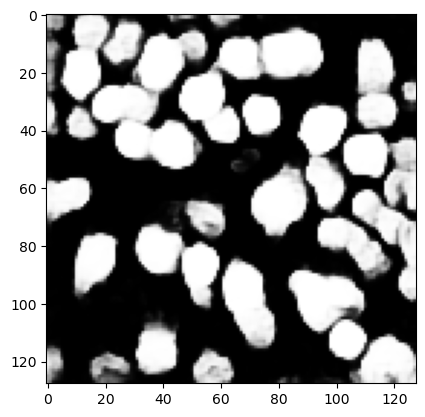

In [25]:
model_Inputs = [U_Net, R2U_Net, AttU_Net, R2AttU_Net, NestedUNet]

def model_unet(model_input, in_channel=3, out_channel=1):
    model_test = model_input(in_channel, out_channel)
    return model_test

model_test = model_unet(model_Inputs[1], 3, 1)  # change model here

model_test.load_state_dict(torch.load('C:/Users/lucyh/Downloads/Unet-Segmentation-Pytorch-Nest-of-Unets-master/model/Unet_D_100_32/Unet_epoch_100_batchsize_32.pth'))

data_transform = torchvision.transforms.Compose([
            torchvision.transforms.Resize((128,128)),
         #   torchvision.transforms.CenterCrop(96),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])

train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('CUDA is not available. Training on CPU')
else:
    print('CUDA is available. Training on GPU')
device = torch.device("cuda:0" if train_on_gpu else "cpu")

im_tb = Image.open("C:/Users/lucyh/Desktop/Images/Cells/Images/Mock 2 T0-0002-5k_#path610.tiff").convert('RGB')
s_tb = data_transform(im_tb)
pred_tb = model_test(s_tb.unsqueeze(0).to(device)).cpu()
pred_tb = F.sigmoid(pred_tb)
pred_tb = pred_tb.detach().numpy()
pred_tb = pred_tb[0, 0, :, :]

plt.imshow(pred_tb, cmap='gray')

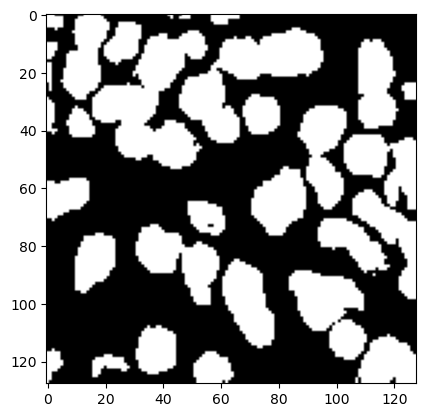

In [26]:
# Put threshold to make it binary
binarr = np.where(pred_tb>0.5, 1, 0)
# Covert numpy array back to image 
plt.imshow(binarr, cmap='gray')